In [1]:
# %load_ext autoreload
# %autoreload 2
import os, sys

import PATH
import scanpy as sc
import anndata as ad
import numpy as np
from src import _sampler
from src import _learner
from src import _reader

import torch
from torch import nn
from matplotlib import pyplot as plt
from torch.utils.data import DataLoader

In [2]:
from src._configure import Yaml_configurer

sys.path.append(os.path.join(PATH.main_dir, "script"))

from script.main_train_with_PL_trainer import dl_from_config, get_model_from_config, get_sampler_from_configs
import PATH
from src import _diffplot as dfp
import pandas as pd

/ssd/users/wergillius/Project/diffuse_differentiate/script/path_n_util.py
/ssd/users/wergillius/Project/diffuse_differentiate/machine_config.json


# **Load Equivalent Diff**

In [5]:
# checkpoint
def get_ckpt_path(relative_path):
    """the relative path is the name Shown in TensorBoard"""
    onemore_layer = os.path.join(PATH.pth_dir, relative_path, "checkpoints")
    ckpts = [file for file in os.listdir(onemore_layer) if file.endswith(".ckpt")]
    abs_paths = [os.path.join(onemore_layer, ckpt) for ckpt in ckpts]
    if len(abs_paths) == 1:
        return abs_paths[0]
    else: 
        return abs_paths

In [6]:
# config
model_config = os.path.join(PATH.main_dir, "configs/Barcodelet_DDPM/mesendo_5layer_k=15.yaml")
configs = Yaml_configurer(model_config)

In [7]:
v0_ckpt = get_ckpt_path(
    "Equivalent_Diffuse_Sampler/Epsilon_Linear_mesendo_5layer_k=15/lightning_logs/version_0"
        )

In [8]:
# dataloaders
train_dl, val_dl, test_dl = dl_from_config(configs, shuffle=False)

In [9]:
# models
eps_net = get_model_from_config(configs, "0")
Sampler_pl_module = eval("_learner."+configs.sampler_class)

In [81]:
v0_equi_diff = Sampler_pl_module.load_from_checkpoint(v0_ckpt, model=eps_net).to('cpu')

In [82]:
v0_equi_diff.eval();

# **test the model**

reload the adata

In [12]:
adata=train_dl.dataset.adata

In [ ]:
adata

AnnData object with n_obs × n_vars = 4698 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RA', 'Wnt', 'TgfB', 'Bmp', 'Fgf', 'Notch', 'Shh', 'assignment', 'starting.state', 'dataset', 'control', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'dpt_pseudotime', 'discrete_time', 'split'
    var: 'features'
    uns: 'assignment_colors', 'diff', 'diffmap_evals', 'dpt_changepoints', 'dpt_groups_colors', 'dpt_grouptips', 'iroot', 'neighbors', 'umap', 'unique_token_dict'
    obsm: 'X_diffmap', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'diff_connectivities', 'diff_distances', 'distances'

### pick an example class

In [174]:
example_class = 'RA+Wnt+TgfB+Bmp+Fgf+'

c = adata.uns['unique_token_dict'][example_class]
c = torch.tensor([[4]]).long()

In [175]:
control_cb = np.random.choice(adata.obs.query("`control` == 1").index)
control_x = adata[control_cb].X

In [274]:
obs_df = adata.obs.query("`assignment` == @example_class")
start_x = adata[obs_df.query('`discrete_time`==55').index].X         # min time = 2
end_x = adata[obs_df.query('`discrete_time`==170').index].X         # max time = 170

In [275]:
# 
start_X = torch.from_numpy(start_x).float()
end_X = torch.from_numpy(end_x).float()

In [178]:
batch = None

In [185]:
X = start_X

In [276]:
X_ts = []
t_ls = []
with torch.no_grad():
    for t in range(55, 170):
        T = torch.tensor([t]).long()
        eps_pred = v0_equi_diff(X, T , None , c)
        X = X + eps_pred
        if t % 10 == 0:
            X_ts.append(X.detach().numpy()[0])
            t_ls.append(t)

In [277]:
preded_X = np.stack(X_ts)

base_df = obs_df.query('`discrete_time`==2')
cb = base_df.index[0]
new_cbs = [cb+"-pred-t%d"%t for t in t_ls]

new_obs = pd.concat([base_df]*preded_X.shape[0], axis=0)
new_obs['discrete_time'] = t_ls
new_obs.index = new_cbs

pred_adata = ad.AnnData(X = preded_X, obs=new_obs, var=adata.var)

In [278]:
new_adata = ad.concat([adata, pred_adata], axis=0)

/ssd/users/wergillius/.conda/envs/cpa-env/lib/python3.7/site-packages/anndata/_core/merge.py:945: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  UserWarning,


In [279]:
new_adata.obs['pred_cells'] = [int('pred' in idx) for idx in new_adata.obs.index]

In [280]:
sc.pp.neighbors(new_adata, n_neighbors=30, metric='cosine')
sc.tl.umap(new_adata, min_dist = 0.3, random_state=0)

         Falling back to preprocessing with `sc.pp.pca` and default params.


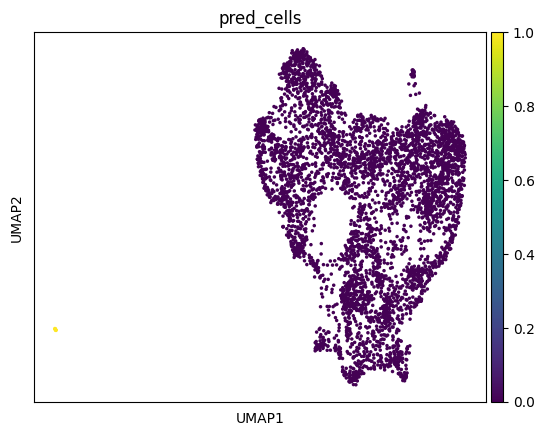

In [281]:
sc.pl.umap(new_adata, color=['pred_cells'])

## predicting 10 step

In [13]:
adata.shape

(4698, 2000)

In [14]:
from tqdm import tqdm

In [15]:
v0_equi_diff = v0_equi_diff.to(3)

In [16]:
@torch.no_grad()
def extrapolate(repeat):
    train_iter = iter(train_dl)

    X_pred_ls = []
    for X, batch_idx, c, noise, t in tqdm(train_iter):
        X = X.to(3)
        t = t.to(3)
        c = c.to(3)
        for j in range(repeat):
            eps_pred = v0_equi_diff(X, t , None , c)
            X = X + eps_pred
        X_pred_ls.append(X.detach().cpu().numpy())

    X_pred_ay = np.concatenate(X_pred_ls, axis=0)

    adata_pred = ad.AnnData(X=X_pred_ay,  obs=adata.obs, var=adata.var)
    adata_pred.obs['extrapolate'] = repeat
    adata_pred.obs.index = [idx+"_pred%d"%repeat for idx in adata_pred.obs.index]
    return adata_pred

In [17]:
merged_expolate = ad.concat([adata]+[extrapolate(i) for i in range(1,10)], axis=0)

100%|██████████| 147/147 [00:04<00:00, 32.18it/s]


In [18]:
merged_expolate.var = adata.var

print("Reuse the loading of annData, preserving cells in the same PC space")
centered_X = merged_expolate.X - merged_expolate.X.mean(axis=0).reshape(1,-1)
merged_expolate.obsm['X_pca'] = centered_X @ adata.varm['PCs']

Reuse the loading of annData, preserving cells in the same PC space


In [19]:
sc.pp.neighbors(merged_expolate, n_neighbors=30, metric='cosine')
sc.tl.umap(merged_expolate, min_dist = 0.3, random_state=0)

In [20]:
## compute representation

In [85]:
train_iter = iter(train_dl)

z_ls = []
z_c_ls = []
c_ls = []
for X, batch_idx, c, noise, t in tqdm(train_iter):
    
    z_dict = v0_equi_diff.model.encode(X, t , None , c)
    
    z_ls.append(z_dict['z'].detach().cpu().numpy())
    z_c_ls.append(z_dict['z_c'].detach().cpu().numpy())
    c_ls.append(z_dict['c'].detach().cpu().numpy())

100%|██████████| 147/147 [00:15<00:00,  9.27it/s]


In [86]:
z_ay = np.concatenate(z_ls, axis=0)
z_c_ay = np.concatenate(z_c_ls, axis=0)
c_ay = np.concatenate(c_ls, axis=0)

In [51]:
z_ay

array([[-2.82526433e-01, -3.72363767e-03, -4.40935753e-02, ...,
        -1.71749110e-04, -2.18410254e-01, -5.94608625e-03],
       [-1.10992074e-01, -9.22536186e-04, -5.50165493e-03, ...,
        -6.28869966e-05,  8.83376691e-03, -1.73845619e-03],
       [-2.40341112e-01, -4.88528535e-02, -1.30286038e-01, ...,
        -3.87511821e-03,  9.32121336e-01, -5.57101406e-02],
       ...,
       [-1.96055621e-01, -8.41764063e-02, -2.01658085e-01, ...,
        -2.63982955e-02, -2.34888792e-01, -8.09835866e-02],
       [-2.34718278e-01, -2.87324518e-01, -3.08658272e-01, ...,
        -4.43066396e-02,  9.55219567e-02, -2.15369746e-01],
       [-2.70415485e-01, -1.37392908e-01, -2.05991656e-01, ...,
        -3.36330407e-03, -2.67700374e-01, -6.01104423e-02]], dtype=float32)

In [52]:
z_c_ay

array([[-0.22660722, -0.28185475, -0.25686842, ..., -0.10449131,
         0.36194956, -0.04291449],
       [ 1.5101107 , -0.30602005, -0.18448229, ..., -0.26315928,
        -0.18096578, -0.2638711 ],
       [-0.15592094, -0.22609161, -0.21512009, ...,  0.19357383,
         1.9695557 ,  1.199367  ],
       ...,
       [-0.29516196, -0.3082136 ,  0.23293112, ..., -0.01890809,
         1.0230559 , -0.17655563],
       [ 1.7294012 , -0.07385186,  0.724464  , ..., -0.21075886,
         1.8015033 ,  1.1936592 ],
       [-0.27842152, -0.16568637,  1.3185192 , ...,  0.23799613,
         1.9340394 , -0.29726848]], dtype=float32)

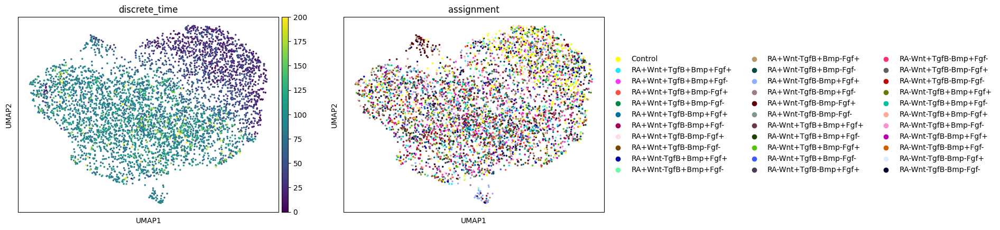

In [49]:
adata_rep = adata.copy()
adata_rep.obsm['Z'] = z_ay

sc.pp.neighbors(adata_rep, n_neighbors=30, key_added='Z' ,use_rep='Z')
sc.tl.umap(adata_rep, min_dist = 0.3, random_state=0, neighbors_key='Z')


sc.pl.umap(adata_rep, color=['discrete_time', 'assignment'])

In [ ]:
sc.set_figure_params(dpi=300)

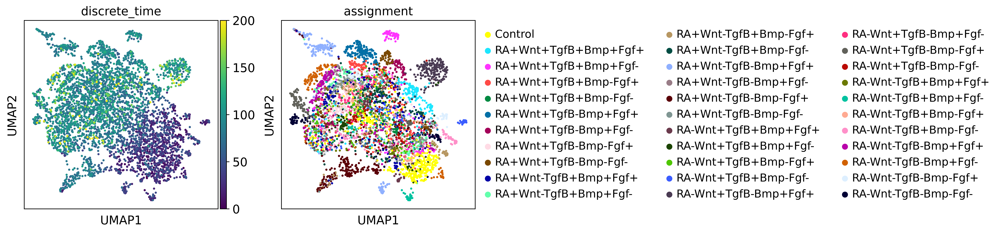

In [78]:
adata_zc = adata.copy()
adata_zc.obsm['Z_c'] = z_c_ay

sc.pp.neighbors(adata_zc, n_neighbors = 10,  metric='cosine', method='umap', key_added='Z_c' ,use_rep='Z_c', )
sc.tl.umap(adata_zc, min_dist = 0.3, alpha=0.5, maxiter=1000, spread=1, random_state=0, neighbors_key='Z_c')
sc.tl.leiden(adata_zc)

sc.pl.umap(adata_zc, color=['discrete_time', 'assignment'])

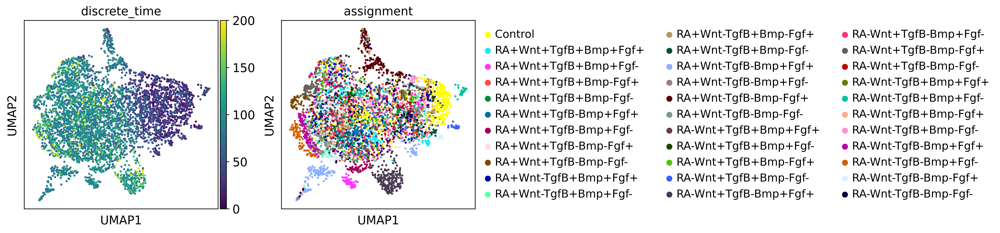

In [79]:
adata_zc = adata.copy()
adata_zc.obsm['Z_c'] = z_c_ay

sc.pp.neighbors(adata_zc, n_neighbors = 15, metric='cosine', method='umap', key_added='Z_c' ,use_rep='Z_c', )
sc.tl.umap(adata_zc, min_dist = 0.3, random_state=0, neighbors_key='Z_c')

sc.pl.umap(adata_zc, color=['discrete_time', 'assignment'])

## recompute for step 7

In [290]:
expolate_til7 = merged_expolate[merged_expolate.obs['extrapolate'] <=7].copy()

In [291]:
sc.pp.neighbors(expolate_til7, n_neighbors=70, metric='cosine')
sc.tl.umap(expolate_til6, min_dist = 0.3, random_state=0)

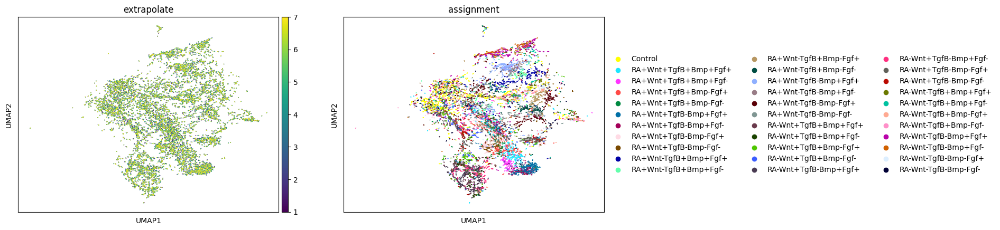

In [292]:
sc.pl.umap(expolate_til6, 
           color=['extrapolate', 'assignment'])

## recompute for day6

In [77]:
expolate_til6 = merged_expolate[merged_expolate.obs['extrapolate'] <=6].copy()

In [80]:
sc.pp.neighbors(expolate_til6, n_neighbors=50, metric='cosine')
sc.tl.umap(expolate_til6, min_dist = 0.3, random_state=0)

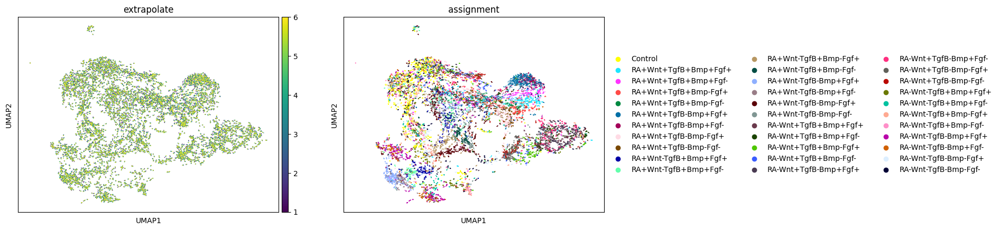

In [81]:
sc.pl.umap(expolate_til6, 
           color=['extrapolate', 'assignment'])

## recompute for day 5

In [61]:
expolate_til5 = merged_expolate[merged_expolate.obs['extrapolate'] <=5].copy()

In [65]:
sc.pp.neighbors(expolate_til5, n_neighbors=30, metric='cosine')
sc.tl.umap(expolate_til5, min_dist = 0.3, random_state=0)

         Falling back to preprocessing with `sc.pp.pca` and default params.


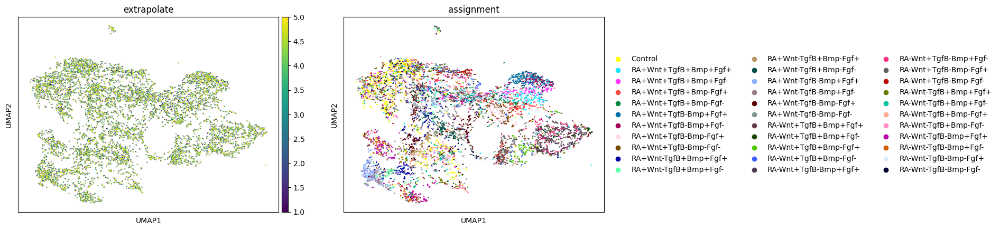

In [66]:
sc.pl.umap(expolate_til5, 
           color=['extrapolate', 'assignment'])

## recompute for step 3

In [116]:
expolate_til3 = merged_expolate[merged_expolate.obs['extrapolate'] <=3].copy()

In [117]:
del expolate_til3.obsm['X_pca']
del expolate_til3.obsm['X_umap']

In [118]:
sc.pp.neighbors(expolate_til3, n_neighbors=30, metric='cosine')
sc.tl.umap(expolate_til3, min_dist = 0.3, random_state=0)

         Falling back to preprocessing with `sc.pp.pca` and default params.


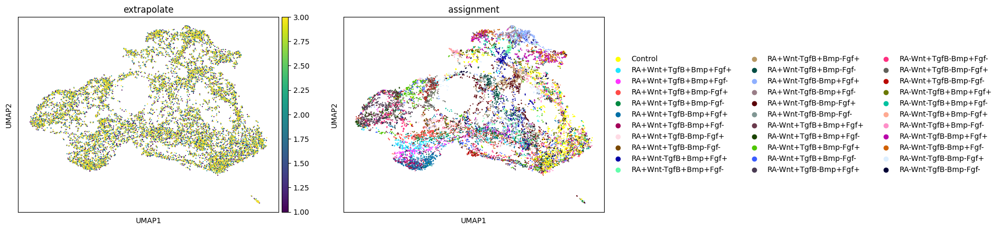

In [119]:
sc.pl.umap(expolate_til3, 
           color=['extrapolate', 'assignment'])

# day 3 - 5

In [90]:
expolate_til3to5 = merged_expolate[merged_expolate.obs.query("3<= `extrapolate` <=5").index].copy()

In [104]:
del expolate_til3to5.obsm['X_pca']
del expolate_til3to5.obsm['X_umap']

In [ ]:
sc.pp.neighbors(expolate_til3to5, n_neighbors=60, metric='cosine')
sc.tl.umap(expolate_til3to5, min_dist = 0.3, random_state=0)

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [ ]:
sc.pl.umap(expolate_til3to5, 
           color=['extrapolate', 'assignment'])

# from step 0

In [95]:
adata.obs['extrapolate'] = 0

In [111]:
adata.varm['PCs']

array([[-0.01427745, -0.01697362, -0.01626975, ...,  0.0219393 ,
         0.01341854,  0.04422385],
       [-0.02866582, -0.09152974,  0.0804701 , ..., -0.00332432,
         0.00903818, -0.00827264],
       [ 0.00363301,  0.00648903, -0.01611056, ...,  0.00582166,
        -0.0177785 , -0.02359337],
       ...,
       [ 0.0159769 , -0.00626958, -0.0184015 , ..., -0.00880488,
         0.00482172, -0.0113102 ],
       [-0.00275049, -0.00157178, -0.0100562 , ...,  0.03002908,
        -0.0030866 ,  0.00741721],
       [-0.00123905,  0.05883588,  0.03779561, ...,  0.03258045,
        -0.05784588, -0.0529564 ]])

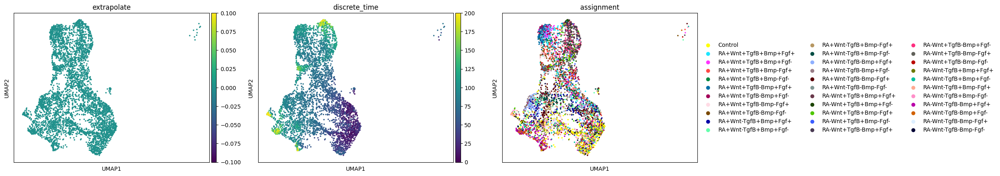

In [126]:
sc.pl.umap(adata, 
           color=['extrapolate', 'discrete_time', 'assignment'])

## compute velocity using t<5

In [274]:
extrapolate_0to5 = merged_expolate[merged_expolate.obs.query("`extrapolate` <= 3").index]

In [275]:
extrapolate_0to5

View of AnnData object with n_obs × n_vars = 18792 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RA', 'Wnt', 'TgfB', 'Bmp', 'Fgf', 'Notch', 'Shh', 'assignment', 'starting.state', 'dataset', 'control', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'dpt_pseudotime', 'discrete_time', 'split', 'time_slot', 'extrapolate'
    var: 'features'
    obsm: 'X_pca'

In [282]:
sc.pp.neighbors(extrapolate_0to5, n_neighbors=50, metric='cosine')
sc.tl.umap(extrapolate_0to5, min_dist = 0.3, random_state=0)

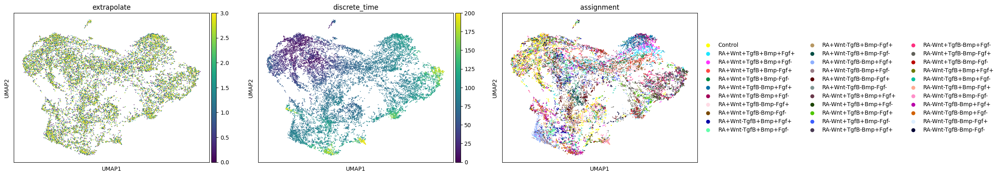

In [283]:
sc.pl.umap(extrapolate_0to5, 
           color=['extrapolate', 'discrete_time', 'assignment'])

In [278]:
start = extrapolate_0to5.obsm['X_umap'][extraplote_0to5.obs.extrapolate == 0]

In [279]:
end = extrapolate_0to5.obsm['X_umap'][extraplote_0to5.obs.extrapolate == 3]

TypeError: umap() missing 1 required positional argument: 'adata'

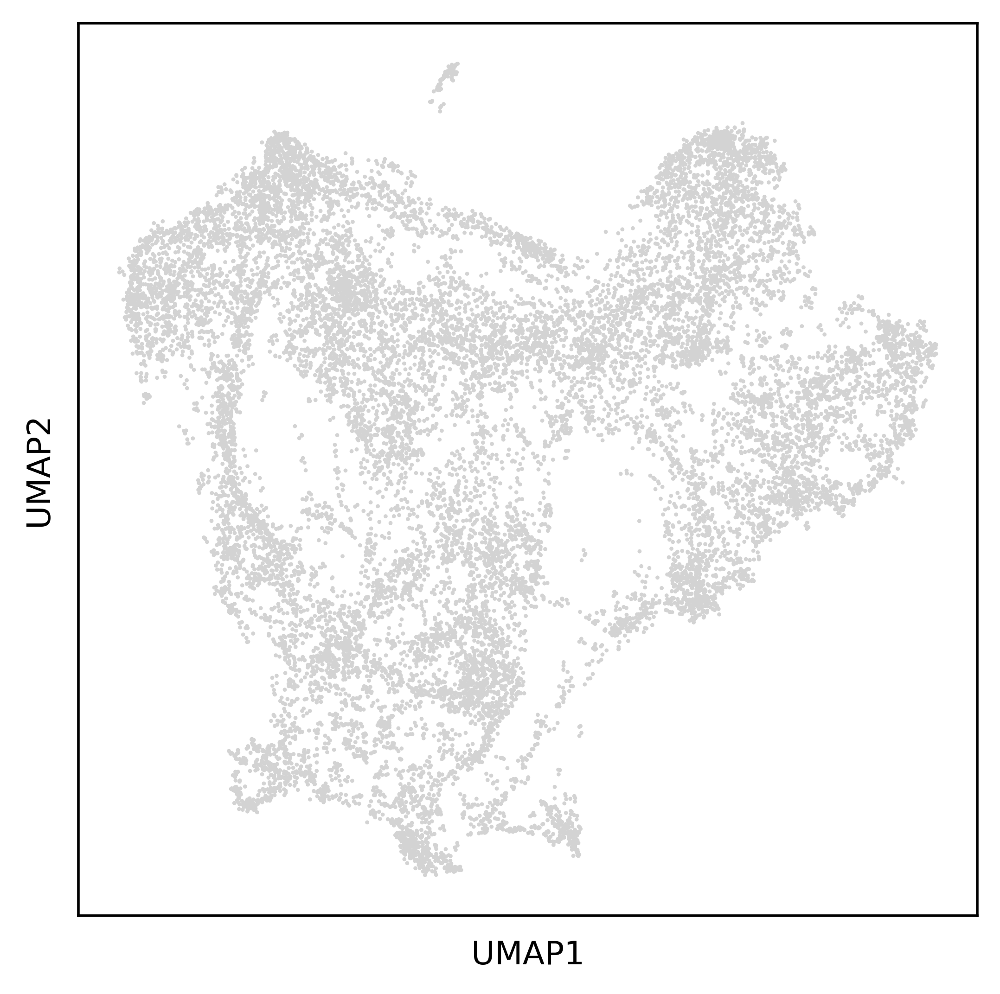

In [271]:
fig , ax = plt.subplots(1,1, figsize=(5,5), dpi=500)
sc.pl.umap(extrapolate_0to5, return_fig=fig, ax=ax, show=False)
sc.pl.umap()

In [284]:
pred_t3=extrapolate_0to5[extrapolate_0to5.obs.extrapolate == 3].X - extrapolate_0to5[extrapolate_0to5.obs.extrapolate == 0].X

adata1 = dfp.compute_velocity(adata, pred_t3)

computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


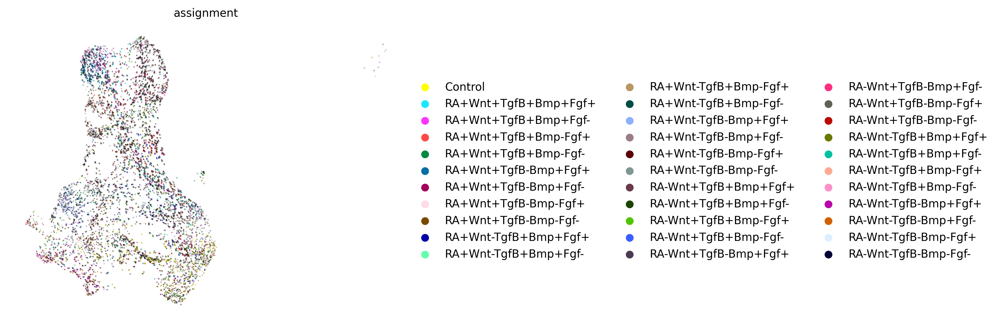

In [288]:
scvelo.pl.velocity_embedding(adata1,
                                    color='assignment', 
                                    legend_loc='far right', dpi=300)

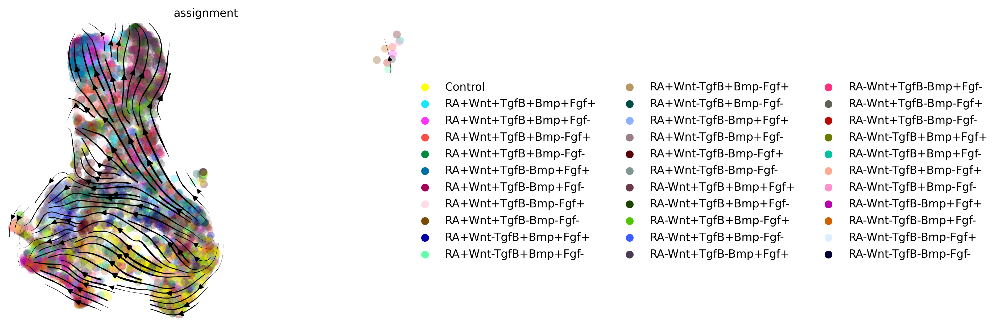

In [289]:
scvelo.pl.velocity_embedding_stream(adata1,
                                    color='assignment', 
                                    legend_loc='far right', dpi=300)

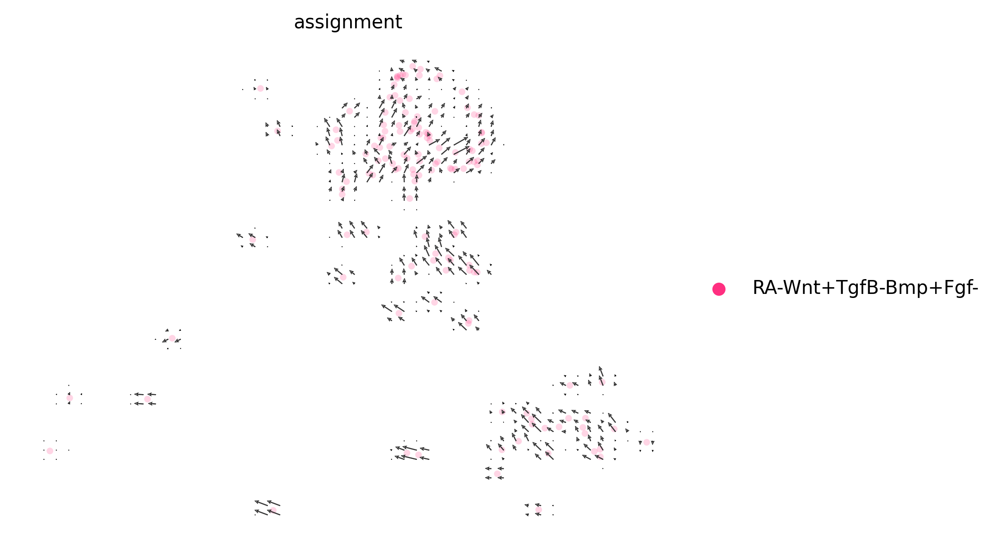

In [293]:
scvelo.pl.velocity_embedding_grid(adata1[adata1.obs.assignment == 'RA-Wnt+TgfB-Bmp+Fgf-'],
                                    color='assignment', s=50,
                                    legend_loc='far right', dpi=300)

In [309]:
from sklearn.metrics.pairwise import cosine_similarity

In [310]:
coseine_similarity = cosine_similarity(pred_t1, pred_t3)

In [314]:
np.diag(coseine_similarity).mean()

0.9733311

In [321]:
pred_t10=merged_expolate[merged_expolate.obs.extrapolate == 9].X - merged_expolate[merged_expolate.obs.extrapolate == 0].X

In [322]:
coseine_similarity = cosine_similarity(pred_t10, pred_t1)

In [323]:
np.diag(coseine_similarity).mean()

0.81367916

In [294]:
pred_t1=extrapolate_0to5[extrapolate_0to5.obs.extrapolate == 1].X - extrapolate_0to5[extrapolate_0to5.obs.extrapolate == 0].X

adata_t1 = dfp.compute_velocity(adata, pred_t1)

computing velocity graph (using 1/40 cores)


  0%|          | 0/4698 [00:00<?, ?cells/s]

    finished (0:01:58) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


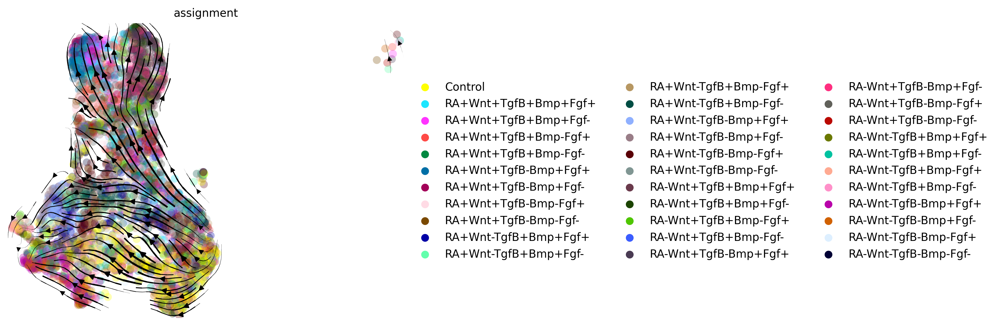

In [295]:
scvelo.pl.velocity_embedding_stream(adata_t1,
                                    color='assignment', 
                                    legend_loc='far right', dpi=300)

In [133]:
# n t 
stem_like = extraplote_0to5[extraplote_0to5.obs.query('`discrete_time` <= 4 & extrapolate==0').index].copy()

In [134]:
stem_like.shape

(60, 2000)

In [135]:
# randomly picking one cell

In [141]:
seed = np.random.randint(0,60) 
x = stem_like.X[seed]

In [155]:
stem_x = torch.from_numpy(x).reshape(1,-1).float().to(3)

In [156]:

response = {}
for cond, token in tqdm(adata.uns['unique_token_dict'].items()):
    c = torch.tensor([token]).reshape(1,1).long().to(3)
    over_t = []
    for t in range(5):
        # [0 , 4]
        T = torch.tensor([t]).long().to(3)
        eps = v0_equi_diff(stem_x, T, None, c)
        over_t.append(eps.detach().cpu().numpy())
    response[cond] = np.mean(over_t, axis)

100%|██████████| 33/33 [00:00<00:00, 229.68it/s]


In [ ]:
response['Control'].mean(axis=0)

In [ ]:
print("hello")